In [ ]:
''' 
Chen et al dataset was added to increase cohort size, and many of the steps done for Joanito et al dataset will be repeated in this script.
'''

In [5]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

import matplotlib.ticker as ticker

In [2]:
PATH_TO_CHEN_ADATA          = '/node200data/18parkky/datasets/data/public/processed_data/CRC_MSI_intensity_analysis_clean_data/adata_c.preprocessed.NanoMnT.h5ad'
PATH_TO_CHEN_METADATA2      = '/node200data/18parkky/datasets/data/public/FASTQ/Immunotherapy_CRC_Chen_et_al/metadata/Chen_et_al.MSI.CRC.woSD.run_meta.organized.tsv'
PATH_TO_CHEN_ALLELETABLE    = '/node200data/18parkky/datasets/data/public/processed_data/CRC_MSI_intensity_analysis_clean_data/NanoMnT.AlleleTable.Chen_et_al.tsv.gz'

PATH_SCMSI_SCORE    = '/home/18parkky/git/CRC_MSI_intensity_analysis/scMSI-score.py'
PATH_SCMSI_FIND     = '/home/18parkky/git/CRC_MSI_intensity_analysis/scMSI-find.py'

DIR_OUT = '/node200data/18parkky/datasets/data/public/processed_data/CRC_MSI_intensity_analysis_clean_data'

## Visualize Author-annotations, sample and MSI scores through UMAP (Extended Data Fig. 3a)

In [7]:
chen_metadata2 = pd.read_csv(PATH_TO_CHEN_METADATA2, sep='\t',)
adata = sc.read_h5ad(PATH_TO_CHEN_ADATA)
adata = adata[~(adata.obs['PatientID'].isin(['P12', 'P08']))].copy()

In [26]:
adata_MSI = adata[(adata.obs['NumSTRLoci']>=10)].copy()

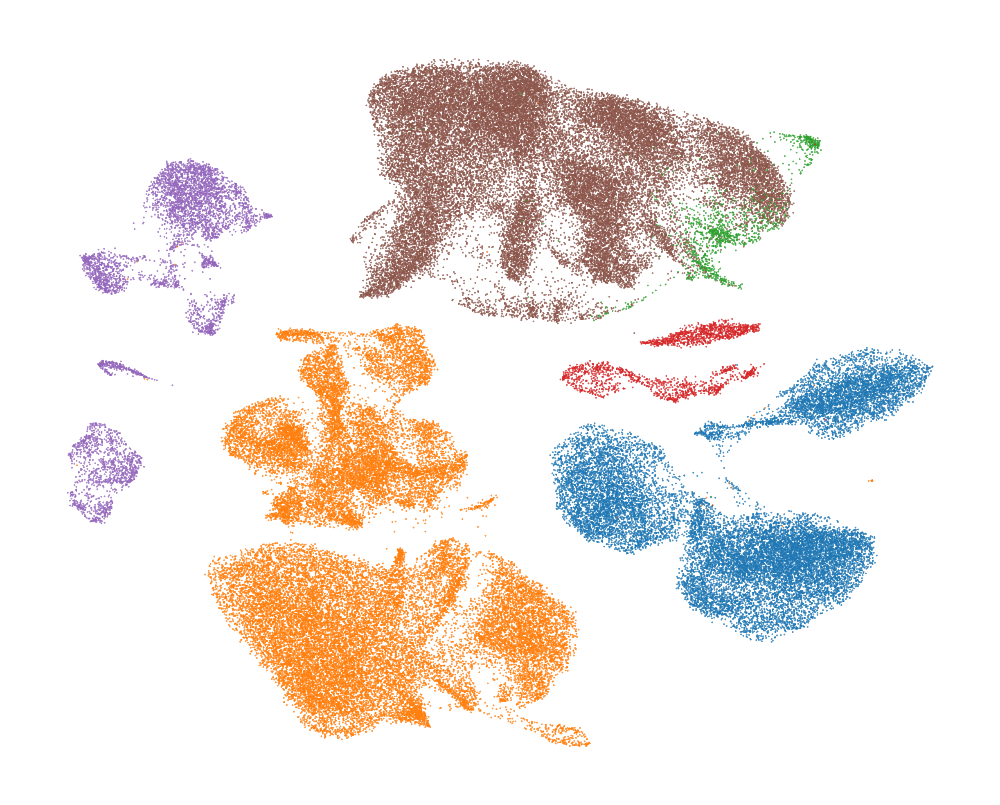

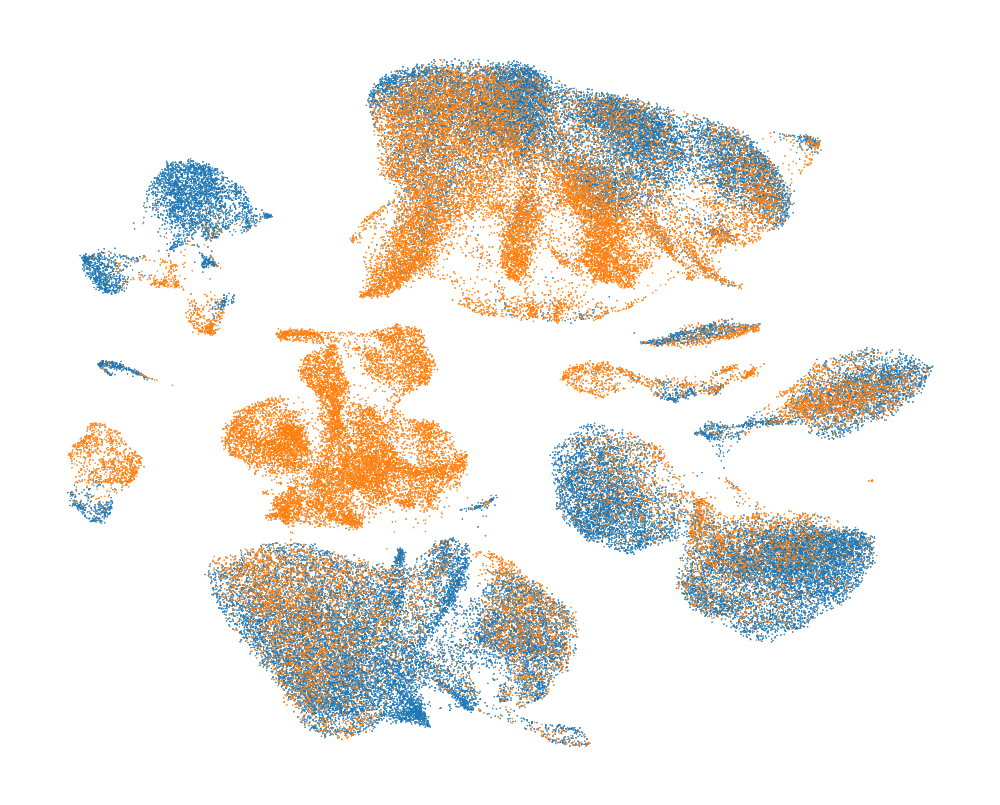

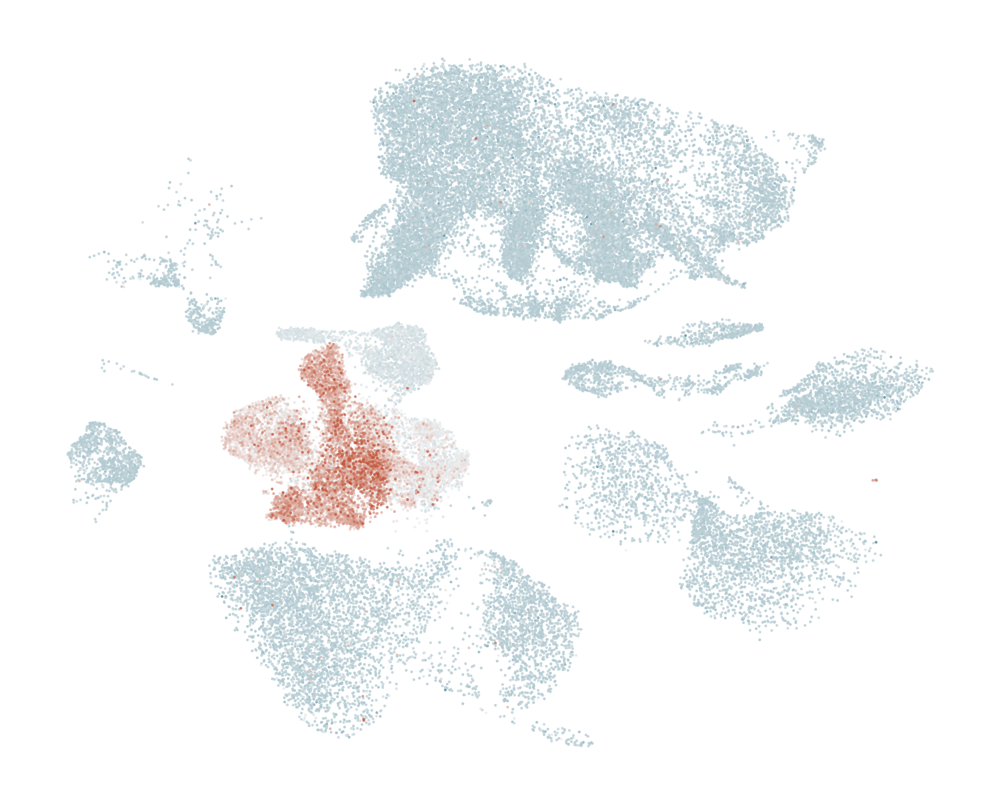

In [27]:
with plt.rc_context({"figure.dpi": (600), 'figure.figsize':(5, 4)}):
    sc.pl.umap(adata, color=['Author_CellType_lvl_1',], 
            frameon=False, 
            legend_loc=None,
            alpha=0.75, 
            title='',
            )
plt.show()

with plt.rc_context({"figure.dpi": (600), 'figure.figsize':(5, 4)}):
    sc.pl.umap(adata, color=['BiopsySite',], 
            frameon=False, 
            legend_loc=None,
            alpha=0.75, 
            title='',
            )
plt.show()

with plt.rc_context({"figure.dpi": (600), 'figure.figsize':(5, 4)}):
    sc.pl.umap(adata_MSI, color=['MSI_score',], 
            frameon=False, 
            vmin=-5, vmax=10,
            cmap=sns.diverging_palette(220, 20, as_cmap=True),
            colorbar_loc=None,
            legend_loc=None,
            alpha=0.75, 
            title='',
            )
plt.show()

## Epithelial subclustering

In [28]:
adata_epi = adata[(adata.obs['Author_CellType_lvl_1']=='Epi')].copy()
adata_epi = adata_epi.raw.to_adata()

In [29]:
sc.pp.normalize_total(adata_epi)
sc.pp.log1p(adata_epi)
adata_epi.raw = adata_epi.copy()

sc.pp.highly_variable_genes(adata_epi, n_top_genes=2000, batch_key="SampleID")
adata_epi = adata_epi[:, adata_epi.var.highly_variable]

sc.pp.scale(adata_epi, max_value=10)
sc.tl.pca(adata_epi, svd_solver="arpack")

sc.pp.neighbors(adata_epi, n_neighbors=15, n_pcs=40)
sc.tl.umap(adata_epi)

/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [30]:
adata_epi_MSI = adata_epi[(adata_epi.obs['NumSTRLoci']>=10)].copy()

### Visualize MSI score and Patient ID with UMAP (Extended Data Fig. 3a)

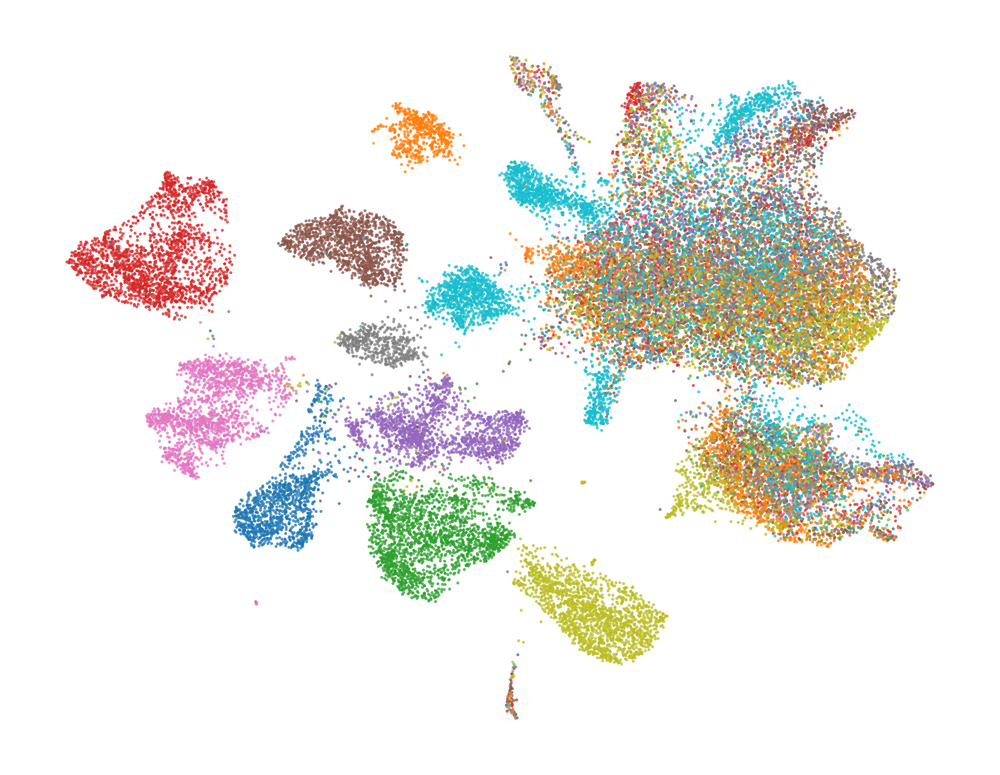

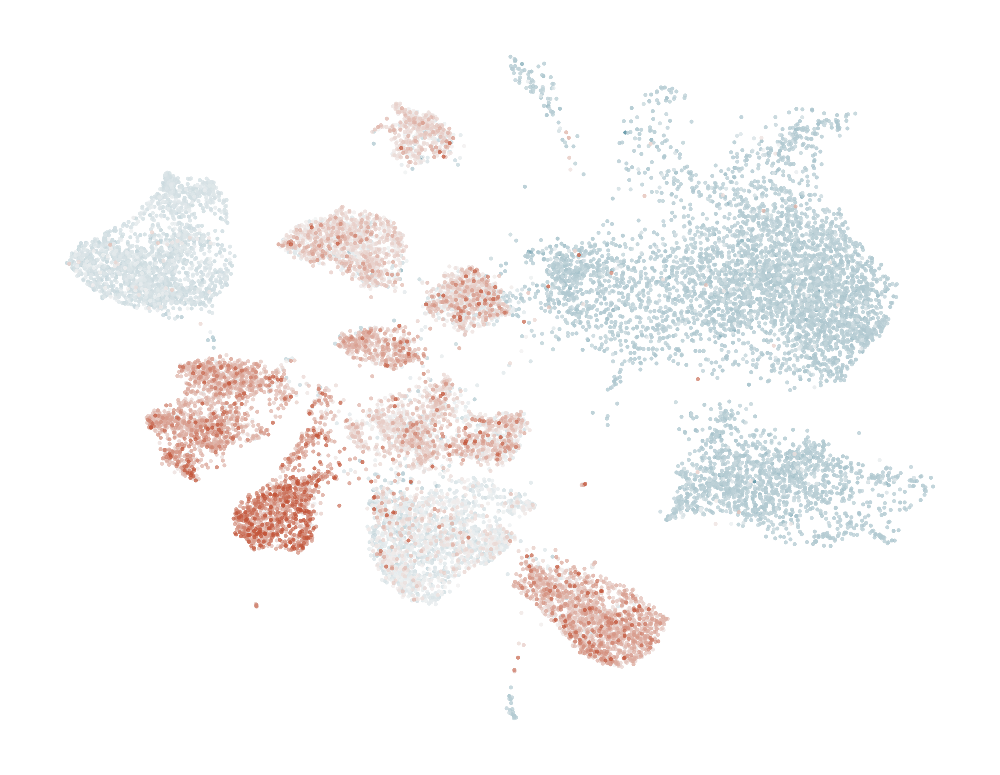

In [33]:
with plt.rc_context({"figure.dpi": (600), 'figure.figsize':(5.2, 4)}):
    sc.pl.umap(adata_epi, color=['PatientID',], 
            frameon=False, 
            alpha=0.75,
            legend_loc=None, 
            # s=10,
            title='',
            )
plt.show()

with plt.rc_context({"figure.dpi": (600), 'figure.figsize':(5.2, 4)}):
    sc.pl.umap(adata_epi_MSI, color=['MSI_score',], 
            frameon=False, 
            vmin=-5, vmax=10,
            cmap=sns.diverging_palette(220, 20, as_cmap=True),
            colorbar_loc=None,
            legend_loc=None,
            alpha=0.75, 
            title='',
            )
plt.show()

### Distinguishing normal vs. tumor cells

/tmp/ipykernel_43551/2939402494.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_epi, resolution=0.2)


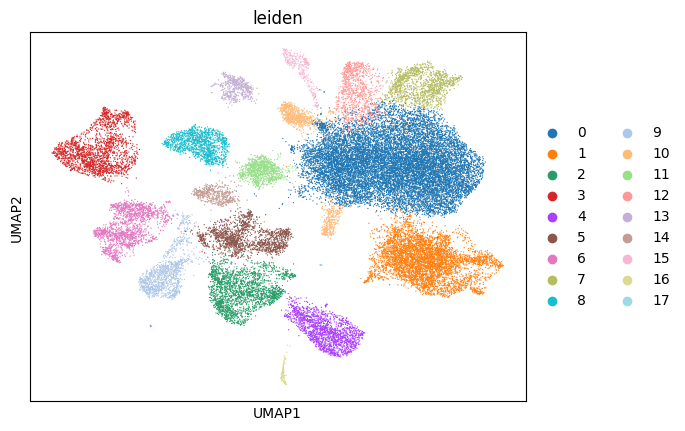

In [34]:
sc.tl.leiden(adata_epi, resolution=0.2)
sc.pl.umap(adata_epi, color=['leiden'])

In [35]:
# Inspect patient-composition of each leiden cluster
l = list()

for leiden, edf in adata_epi.obs.groupby('leiden', observed=True):
    dict_SampleID_to_proportion = dict()
    for SampleID, edf2 in edf.groupby('SampleID', observed=True):
        dict_SampleID_to_proportion[SampleID] = len(edf2)/len(edf)
    dict_SampleID_to_proportion = dict(sorted(dict_SampleID_to_proportion.items(), key=lambda x:x[1], reverse=True))
    
    for SampleID, proportion in dict_SampleID_to_proportion.items():
        MajorSampleID = SampleID
        MajorProportion1 = proportion
        break 
    
    dict_BiopsySite_to_proportion = dict()
    for BiopsySite, edf2 in edf.groupby('BiopsySite', observed=False):
        dict_BiopsySite_to_proportion[BiopsySite] = len(edf2)/len(edf)
    
    print(f'{leiden}\t\t{round(100*MajorProportion1, 1)}\t\t\t{round(100*dict_BiopsySite_to_proportion['Normal'], 1)}\t\t{round(np.mean(edf[edf['NumSTRLoci']!=0]['MSI_score']), 1)}')
    l.append( [leiden, round(100*MajorProportion1, 1), round(100*dict_BiopsySite_to_proportion['Normal'], 1), round(np.mean(edf[edf['NumSTRLoci']!=0]['MSI_score']), 1)] )

l = pd.DataFrame(l, columns=['leiden', 'MajorPatientPerc', 'NormalSamplePerc', 'MSI_score'])

0		12.6			71.5		-0.1
1		16.2			69.7		-0.1
2		99.3			0.0		2.2
3		99.4			0.0		1.3
4		99.8			0.1		4.9
5		97.4			0.9		3.5
6		99.0			0.1		5.2
7		35.5			84.7		-0.0
8		99.2			0.2		3.3
9		98.2			0.5		6.6
10		94.6			98.0		-0.3
11		98.3			0.5		3.2
12		25.3			88.0		-0.1
13		98.9			1.1		3.3
14		96.5			2.5		4.6
15		24.7			73.2		0.2
16		24.5			77.4		1.0
17		100.0			0.0		3.9


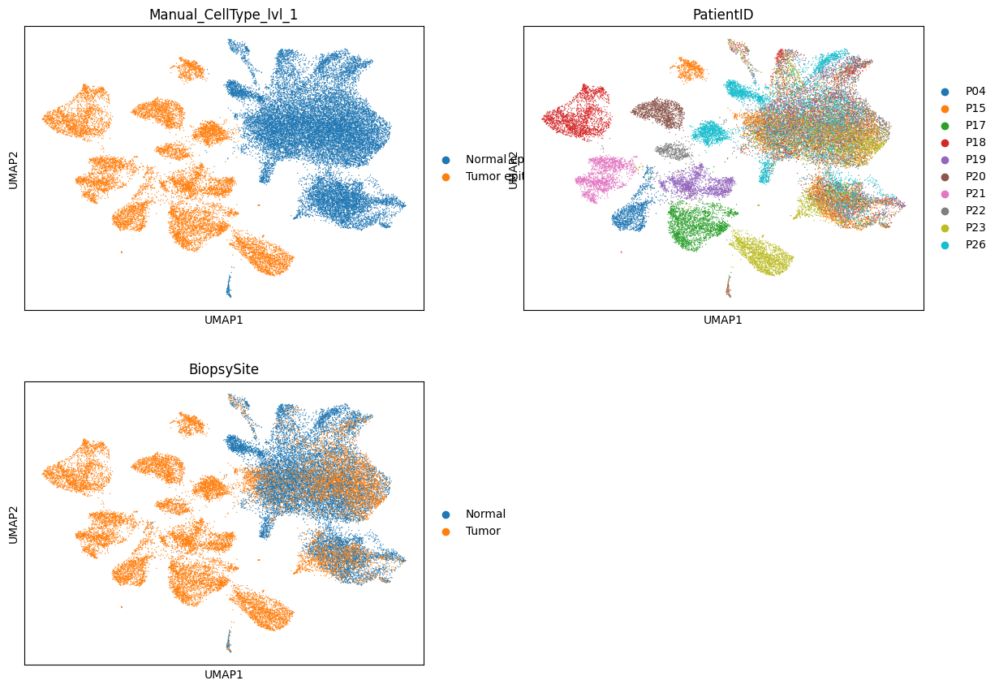

In [38]:
dict_leiden_to_EpiCellType = {
    '0' : 'Normal epithelial',
    '1' : 'Normal epithelial',
    '7' : 'Normal epithelial',
    '10' : 'Normal epithelial', # Although this cluster is mostly formed by Patient 26, low MSI score indicates that and its adjacency to cluster 0 indicates it's a cluster of normal cells
    '12' : 'Normal epithelial',
    '15' : 'Normal epithelial',
    '16' : 'Normal epithelial',

    '2' : 'Tumor epithelial',
    '3' : 'Tumor epithelial',
    '4' : 'Tumor epithelial',
    '5' : 'Tumor epithelial',
    '6' : 'Tumor epithelial',
    '8' : 'Tumor epithelial',
    '9' : 'Tumor epithelial',
    '11' : 'Tumor epithelial',
    '13' : 'Tumor epithelial',
    '14' : 'Tumor epithelial',
    '17' : 'Tumor epithelial',
}

adata_epi.obs['Manual_CellType_lvl_1'] = [ dict_leiden_to_EpiCellType[leiden] for leiden in adata_epi.obs['leiden'] ]
sc.pl.umap(adata_epi, color=['Manual_CellType_lvl_1', 'PatientID', 'BiopsySite'], ncols=2)

### Save annotation results to main Adata

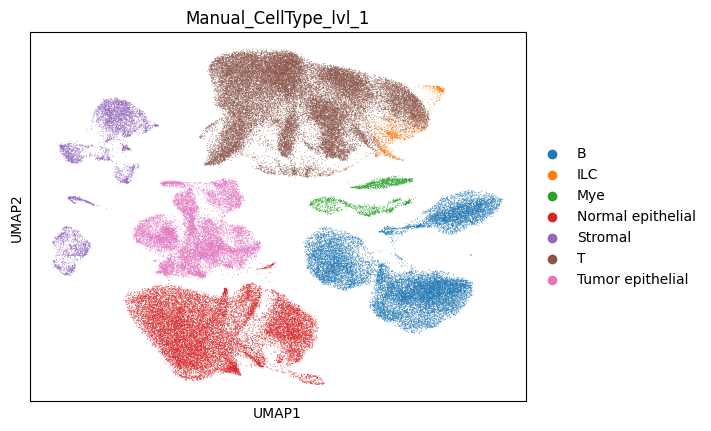

In [39]:
dict_Identifier_to_CellType = { tup.Identifier : tup.Manual_CellType_lvl_1 for tup in adata_epi.obs.itertuples() }

temp = list()
for tup in adata.obs.itertuples():
    try:
        temp.append( dict_Identifier_to_CellType[tup.Identifier] )
    except KeyError:
        temp.append( tup.Author_CellType_lvl_1 )
    
adata.obs['Manual_CellType_lvl_1'] = temp
sc.pl.umap(adata, color=['Manual_CellType_lvl_1'])

### Save results

In [40]:
adata.write(f'{DIR_OUT}/adata_c.preprocessed.NanoMnT.TumorLabeled.h5ad')
adata_epi.write(f'{DIR_OUT}/adata_c.preprocessed.NanoMnT.TumorLabeled.epithelial.h5ad')

In [3]:
adata       = sc.read_h5ad(f'{DIR_OUT}/adata_c.preprocessed.NanoMnT.TumorLabeled.h5ad')
adata_epi   = sc.read_h5ad(f'{DIR_OUT}/adata_c.preprocessed.NanoMnT.TumorLabeled.epithelial.h5ad')

## scMnT results

In [ ]:
''' 
We will apply scMnT to see if MSI patients' cancer cells indeed show MS profile that resembles MSI phenotype
'''

In [41]:
adata_epi_MSI.obs['Manual_CellType_lvl_1'] = [ dict_Identifier_to_CellType[Identifier] for Identifier in adata_epi_MSI.obs['Identifier'] ]

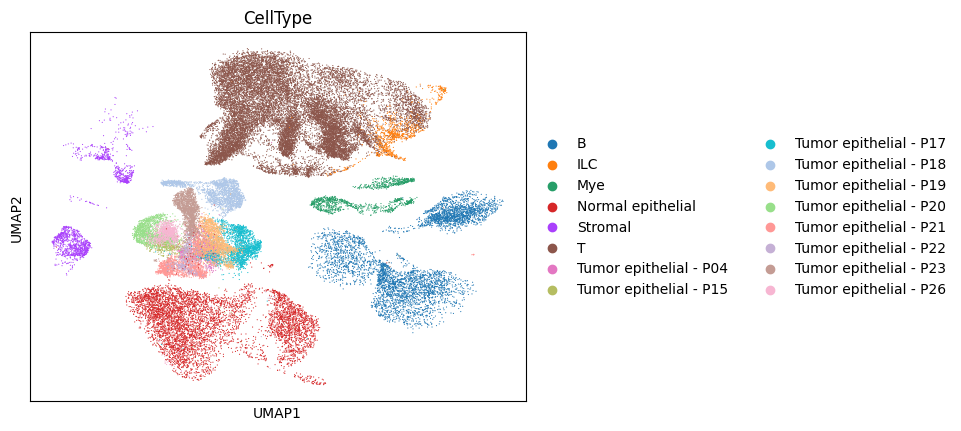

In [42]:
DIR_NANOMNT_OUT = f'{DIR_OUT}/scMSI_Chen_et_al'
if os.path.exists(DIR_NANOMNT_OUT)==False:
    os.mkdir(DIR_NANOMNT_OUT)

# Annotate tumor cells 
dict_Identifier_to_CellType = dict()
for tup in adata_epi_MSI.obs.itertuples():
    if tup.Manual_CellType_lvl_1 == 'Tumor epithelial':
        dict_Identifier_to_CellType[tup.Identifier] = f'Tumor epithelial - {tup.PatientID}'
    else:
        dict_Identifier_to_CellType[tup.Identifier] = f'Normal epithelial'

temp = list()
for tup in adata_MSI.obs.itertuples():
    try:
        temp.append( dict_Identifier_to_CellType[tup.Identifier] )
    except KeyError:
        temp.append( tup.Author_CellType_lvl_1 )
    
adata_MSI.obs['CellType'] = temp

sc.pl.umap(adata_MSI, color=['CellType'])
adata_MSI.write(f'{DIR_NANOMNT_OUT}/adata_c.preprocessed.NanoMnT.scMSI_input.h5ad')

In [44]:
# We will use T cells as reference and use other normal cells as control
cmd = f'python {PATH_SCMSI_FIND} -a {DIR_NANOMNT_OUT}/adata_c.preprocessed.NanoMnT.scMSI_input.h5ad -n T -out {DIR_NANOMNT_OUT}'
!{cmd}

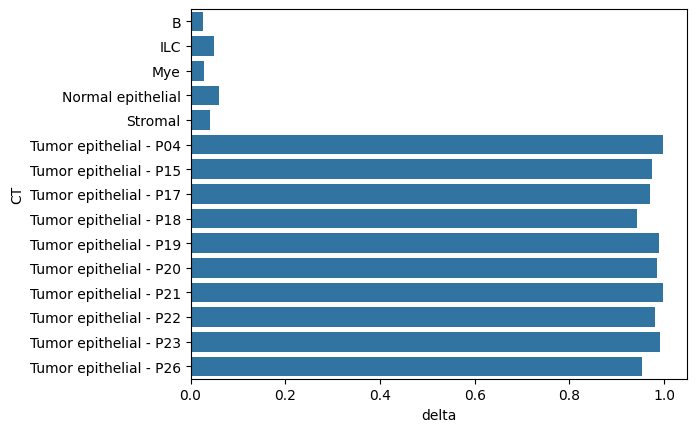

In [45]:
scMSI_results = pd.read_csv(f'{DIR_NANOMNT_OUT}/adata_c.preprocessed.NanoMnT.scMSI_input.findMSI_results.tsv', sep='\t')
sns.barplot(data=scMSI_results, y='CT', x='delta')
plt.show()

## Visualization of MSI scores of patients by comparing tumor cells vs. non-tumor cells (Extended Data Fig. 3b)

In [4]:
adata.obs['isTumor'] = [ bool(Manual_CellType_lvl_1=='Tumor epithelial') for Manual_CellType_lvl_1 in adata.obs['Manual_CellType_lvl_1'] ]
adata.obs.head(2)

,doublet_score,predicted_doublet,SampleID,PatientID,BiopsySite,Accession,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,...,Identifier,Author_CellType_lvl_1,Author_CellType_lvl_2,n_genes,AvgSTRDiff,StdSTRDiff,NumSTRLoci,MSI_score,Manual_CellType_lvl_1,isTumor
AAACCTGAGAATTCCC-1,0.013780,False,P04-N-I,P04,Normal,HRR1372976,1197,7.088409,2594.0,7.861342,...,P04-N-I-AAACCTGAGAATTCCC,T,c20_CD8_Tem_GZMK,1197,0.0,0.0,0,-0.0,T,False
AAACCTGAGCTAGGCA-1,0.021638,False,P04-N-I,P04,Normal,HRR1372976,1206,7.095893,3195.0,8.069655,...,P04-N-I-AAACCTGAGCTAGGCA,B,c40_NaiveB_IGHD,1206,0.0,0.0,0,-0.0,B,False


In [ ]:
['P18', 'P17', 'P26', 'P15', 'P20', 'P19', 'P22', 'P23', 'P21', 'P04']

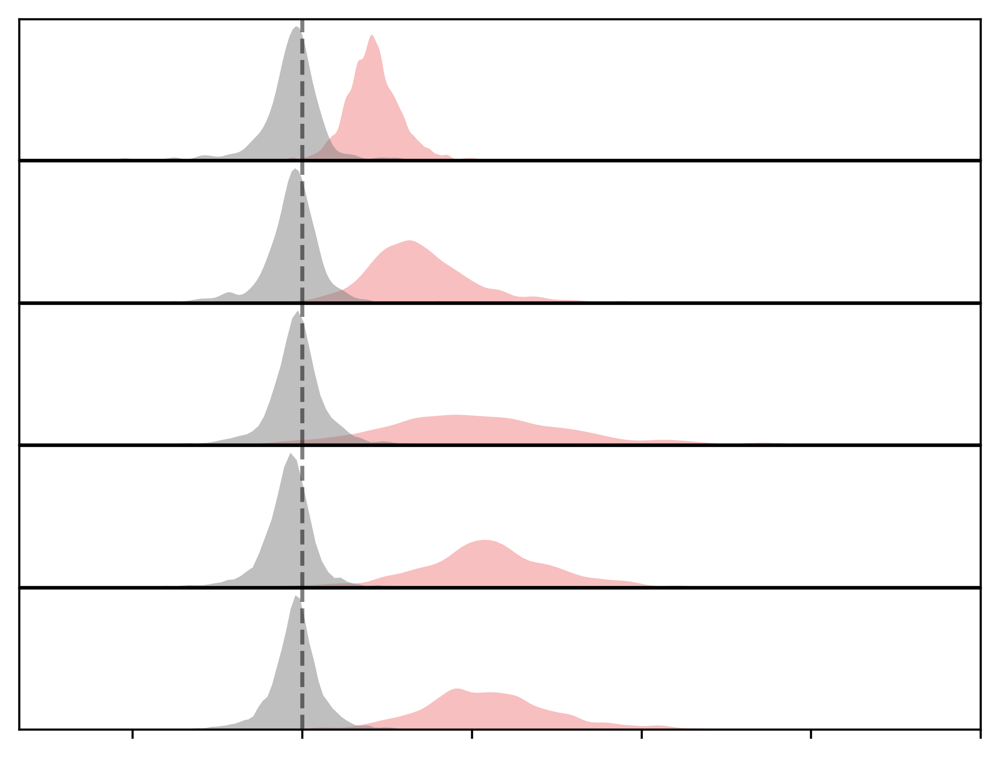

In [26]:
# MSS patients 
fig, axes = plt.subplots(5, 1, figsize=( 5, 3.75 ), dpi=400, sharex=True, sharey=False)
plot_type_oi = sns.kdeplot
palette_e = { True : sns.color_palette('colorblind')[1], False : sns.color_palette('colorblind')[2] }
palette_e = { True : 'limegreen', False :'gray'}
palette_e = { True : 'lightcoral', False :'gray'}

min_STRn = 10
bw_adjust_e = 0.5

for idx, patient in enumerate(['P18', 'P17', 'P26', 'P15', 'P20', ]):

    adata_obs_oi = adata[(adata.obs['NumSTRLoci']>=min_STRn) & 
                        (adata.obs['PatientID']==patient)].obs

    plot_type_oi(data=adata_obs_oi, 
                        x='MSI_score', hue='isTumor', 
                        legend=None, 
                        fill=True, 
                        alpha=0.5,
                        linewidth=0, common_norm=False, bw_adjust=bw_adjust_e,
                        palette=palette_e, ax=axes[idx], 

                        )
    # for isTumor, edf in adata_obs_oi.groupby("isTumor"):
    #     axes[idx].axvline( np.mean(edf['MSI_score']), color=palette_e[isTumor], ls='--', alpha=0.75, )
        
    axes[idx].set_xlabel('');
    axes[idx].set_ylabel('');
    axes[idx].set_xticklabels([]);
    axes[idx].set_yticklabels([]);
    axes[idx].set_yticks([]);
    
    axes[idx].xaxis.set_major_locator(ticker.MultipleLocator(3))
    # axes[idx].xaxis.set_major_formatter(ticker.ScalarFormatter())

    if idx != 4:
        axes[idx].tick_params(left=True, bottom=False);
            
    axes[idx].axvline( 0, color='black', ls='--', alpha=0.5, )
    
axes[idx].set_xlim([-5, 12]);
# axes[idx].set_ylim([0, 2.2]);


fig.tight_layout(pad=0.05,);

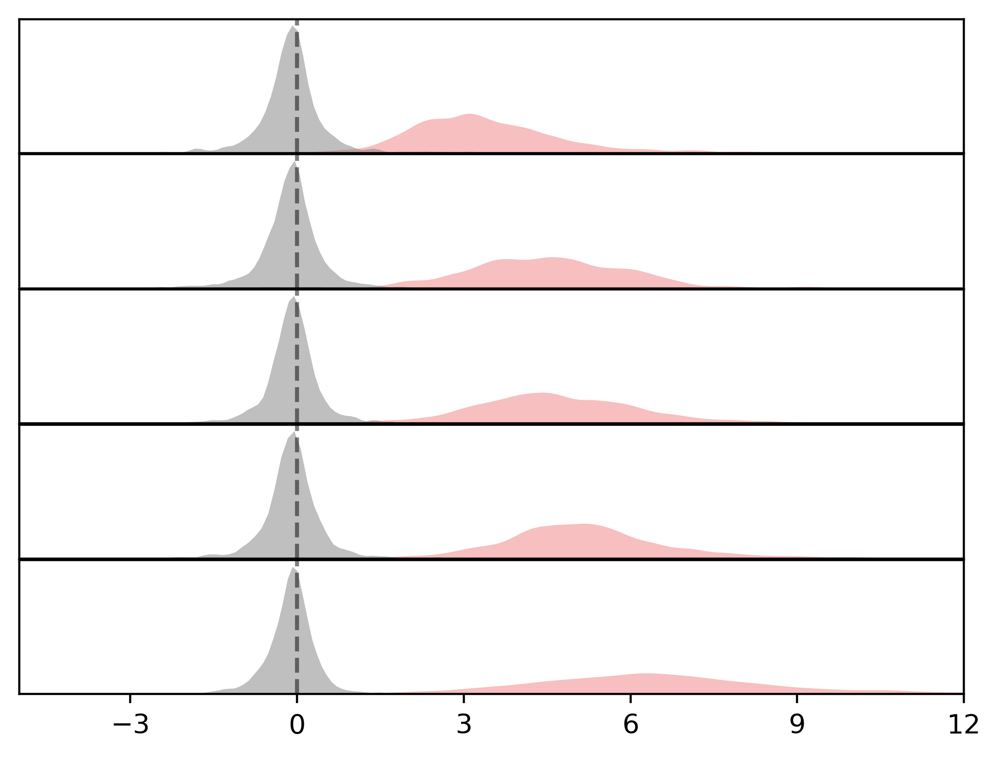

In [28]:
# MSS patients 
fig, axes = plt.subplots(5, 1, figsize=( 5, 3.75 ), dpi=400, sharex=True, sharey=False)
plot_type_oi = sns.kdeplot
palette_e = { True : sns.color_palette('colorblind')[1], False : sns.color_palette('colorblind')[2] }
palette_e = { True : 'limegreen', False :'gray'}
palette_e = { True : 'lightcoral', False :'gray'}

min_STRn = 10
bw_adjust_e = 0.5

for idx, patient in enumerate(['P19', 'P22', 'P23', 'P21', 'P04']):

    adata_obs_oi = adata[(adata.obs['NumSTRLoci']>=min_STRn) & 
                        (adata.obs['PatientID']==patient)].obs

    plot_type_oi(data=adata_obs_oi, 
                        x='MSI_score', hue='isTumor', 
                        legend=None, 
                        fill=True, 
                        alpha=0.5,
                        linewidth=0, common_norm=False, bw_adjust=bw_adjust_e,
                        palette=palette_e, ax=axes[idx], 

                        )
    # for isTumor, edf in adata_obs_oi.groupby("isTumor"):
    #     axes[idx].axvline( np.mean(edf['MSI_score']), color=palette_e[isTumor], ls='--', alpha=0.75, )
        
    axes[idx].set_xlabel('');
    axes[idx].set_ylabel('');
    # axes[idx].set_xticklabels([]);
    axes[idx].set_yticklabels([]);
    axes[idx].set_yticks([]);
    
    axes[idx].xaxis.set_major_locator(ticker.MultipleLocator(3))
    # axes[idx].xaxis.set_major_formatter(ticker.ScalarFormatter())

    if idx != 4:
        axes[idx].tick_params(left=True, bottom=False);
            
    axes[idx].axvline( 0, color='black', ls='--', alpha=0.5, )
    
axes[idx].set_xlim([-5, 12]);
# axes[idx].set_ylim([0, 2.2]);


fig.tight_layout(pad=0.05,);

## Visualization of MSI scores of patients across different MS lengths

In [5]:
AlleleTable = pd.read_csv(PATH_TO_CHEN_ALLELETABLE, sep='\t')
AlleleTable = AlleleTable[(AlleleTable['SampleID'].isin(chen_metadata2['SampleID']))].copy()

In [11]:
# Label isTumor (distinguish tumor cells vs. normal cells in AlleleTable)
dict_Identifier_to_isTumor = { tup.Identifier : bool(tup.Manual_CellType_lvl_1=='Tumor epithelial') for tup in adata.obs.itertuples() }
for identifier in AlleleTable['Identifier']:
    try:
        dict_Identifier_to_isTumor[identifier]
    except KeyError:
        dict_Identifier_to_isTumor[identifier] = 'N/A'
AlleleTable['isTumor'] = [ dict_Identifier_to_isTumor[identifier] for identifier in AlleleTable['Identifier'] ]

# Label patient ID
AlleleTable['PatientID'] = [ SampleID.split('-')[0] for SampleID in AlleleTable['SampleID'] ]

In [12]:
MSProfileByLength = list()
for PatientID, edf in AlleleTable.groupby("PatientID"):
    for isTumor, edf2 in edf.groupby("isTumor"):
        for reference_STR_allele, edf3 in edf2.groupby("reference_STR_allele"):
            MSProfileByLength.append( [PatientID, reference_STR_allele, isTumor, np.mean(edf3['diff'].dropna()), np.std(edf3['diff'].dropna()), len(edf3.dropna()), ] )
MSProfileByLength = pd.DataFrame(MSProfileByLength, columns=['PatientID', 'reference_STR_allele', 'isTumor', 'AvgSTRDiff', 'StdSTRDiff', 'NumSTRLoci'])
MSProfileByLength['MSI_score'] = -1 * MSProfileByLength['AvgSTRDiff'] * MSProfileByLength['StdSTRDiff']

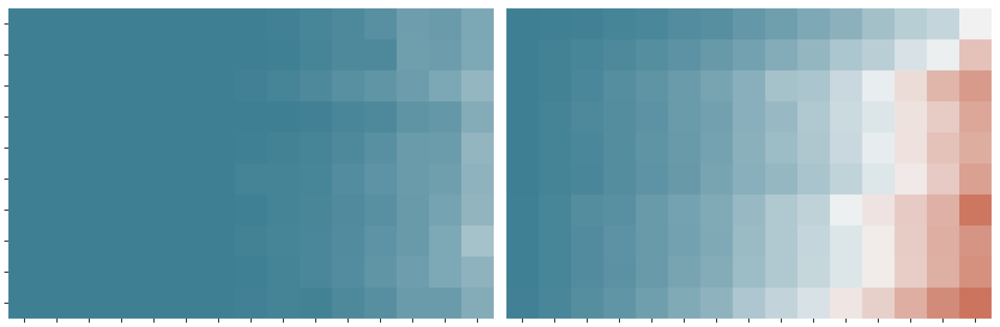

In [17]:
# Calculate tumor-normal by microsatellite length
fig, axes = plt.subplots(1, 2, figsize=(12, 4), dpi=500, sharex=True, sharey=True)
palette_e = sns.diverging_palette(220, 20, as_cmap=True)
list_heatmap_patient_order = ['P18', 'P17', 'P26', 'P15', 'P20', 'P19', 'P22', 'P23', 'P21', 'P04']

vmin_e, vmax_e = -3, 3
vmin_e, vmax_e = 0, 30

ax = sns.heatmap(MSProfileByLength[(MSProfileByLength['isTumor']==False)].pivot( index='PatientID', columns='reference_STR_allele', values='MSI_score' ).reindex(list_heatmap_patient_order), 
            cmap=palette_e, ax=axes[0],
            vmin=vmin_e, vmax=vmax_e, 
            cbar=False
            )
ax.set_xlabel('');
ax.set_xticklabels([]);
ax.set_yticklabels([]);
ax.set_ylabel('');
ax.tick_params(bottom=True)

ax = sns.heatmap(MSProfileByLength[(MSProfileByLength['isTumor']==True) ].pivot( index='PatientID', columns='reference_STR_allele', values='MSI_score' ).reindex(list_heatmap_patient_order), 
            cmap=palette_e, ax=axes[1],
            vmin=vmin_e, vmax=vmax_e, 
            cbar=False,
            )
ax.set_xlabel('');
ax.set_ylabel('');
ax.set_xticklabels([]);
ax.set_yticklabels([]);
ax.tick_params(left=False, bottom=True)

fig.tight_layout();
plt.show()